# **Multi-Armed Bandit Algorithms in Reinforcement Learning**

# Please install the following python libraries
- python3: https://www.python.org/
- numpy: https://numpy.org/install/
- tqdm: https://github.com/tqdm/tqdm#installation
- matplotlib: https://matplotlib.org/stable/users/installing/index.html

If you encounter the error: "IProgress not found. Please update jupyter & ipywidgets"
    
Please install the ipywidgets as follows:

    with pip, do
    - pip install ipywidgets
    
    with conda, do
    - conda install -c conda-forge ipywidgets
    
Restart your notebook

Reference Book from which we are producing the figures for this project, and the equations referered from is:

Reinforcement Learning: An Introduction (second edition) by Richard S. Sutton and Andrew G. Barto

In [ ]:
pip install ipywidgets

In [1]:
#Import the necessary packages
import numpy as np
import random
import tqdm.notebook as tqdm
import matplotlib.pyplot as plt
from matplotlib.ticker import PercentFormatter

In [2]:
"""Here is the implementation of the 10-armed Bandit problem/testbed.
   Note that:
       - call the reset function whenever you want to generate a new 10-armed Bandit problem
"""
class Bandit(object):
    def __init__(self, k=10):
        # Number of the actions
        self.k = k

        # Numpy array to store the true action value for the k arms/actions
        self.q_star = np.empty(self.k)

    def reset(self):
        # Reset the true action values to generate a new k-armed bandit problem
        # Value for each arm is randomly sampled from a normal distribution
        # with mean = 0, variance = 1.0.
        self.q_star = np.random.normal(loc=0, scale=1, size=self.k)

    def best_action(self):
        """Return the indices of all best actions/arms in a list variable
        """
        return np.where(self.q_star == self.q_star.max())[0].tolist()

    def step(self, act):
        """
        Args:
            act (int): index of the action
        """
        # Compute the reward for each action
        # The reward for each action at time step t is sampled from a Gaussian distribution
        # For the k-th arm, the mean = q_star[k] (true value) and variance = 1
        rewards = np.random.normal(loc=self.q_star, scale=np.ones(10), size=self.k)
        return rewards[act]

In [3]:
"""Here is the plotting function you can directly use to plot the figures needed for Q5 and Q6
"""

# plot function
def plot_curves(arr_list, legend_list, color_list, upper_bound, ylabel):
    """
    Args:
        arr_list (list): list of results arrays to plot
        legend_list (list): list of legends corresponding to each result array
        color_list (list): list of color corresponding to each result array
        upper_bound (numpy array): array contains the best possible rewards for 2000 runs. the shape should be (2000,)
        ylabel (string): label of the Y axis

        Note that, make sure the elements in the arr_list, legend_list and color_list are associated with each other correctly.
        Do not forget to change the ylabel for different plots.

        To plot the upper bound for % Optimal action figure, set upper_bound = np.ones(num_step), where num_step is the number of steps.
    """
    # set the figure type
    plt.clf()
    fig, ax = plt.subplots(figsize=(12, 8))

    # PLEASE NOTE: Change the labels for different plots
    ax.set_ylabel(ylabel)
    ax.set_xlabel("Steps")

    # If plotting the optimal action figure, format the y-axis as a percentage
    if ylabel == "% Optimal Action":
        ax.yaxis.set_major_formatter(PercentFormatter(xmax=1))

    ax.set_ylim(-0.1, upper_bound.mean() + 0.1)

    # ploth results
    h_list = []
    for arr, legend, color in zip(arr_list, legend_list, color_list):
        # compute the standard error
        arr_err = arr.std(axis=0) / np.sqrt(arr.shape[0])
        # plot the mean
        h, = ax.plot(range(arr.shape[1]), arr.mean(axis=0), color=color, label=legend)
        # plot the confidence band
        arr_err = 1.96 * arr_err
        ax.fill_between(range(arr.shape[1]), arr.mean(axis=0) - arr_err, arr.mean(axis=0) + arr_err, alpha=0.3, color=color)
        # save the plot handle
        h_list.append(h)

    # plot the upper bound
    h = plt.axhline(y=upper_bound.mean(), color='k', linestyle='--', label="upper bound")
    h_list.append(h)

    # plot legends
    ax.legend(handles=h_list)
    plt.show()

# Q5: Implement the ε-greedy algorithm with incremental update

The following is the scaffolding code for the epsilon-greedy agent.

    1. Reset function: reset the Q value for each arm/action to be self.init. (e.g., self.init = 0)
    
    2. Choose action: select the arm/action using epsilon-greedy strategy.
    
    3. Update: update the time steps, Q values for k arms/actions and numbers of selecting each arm/action.
    
    4. argmax: find the indices of all maximal values in a numpu array.

In [4]:
class EpsilonGreedyAgent(object):
    def __init__(self, k: int, init: int, epsilon: float) -> None:
        """Epsilon greedy bandit agent

        Args:
            k (int): number of arms
            init (init): initial value of Q-values
            epsilon (float): random action probability
        """
        # Number of the arms. For example, k = 10 for 10-armed Bandit problem
        self.k = k

        # Initial Q value
        self.init = init

        # Epsilon value
        self.epsilon = epsilon

        # Q-values for each arm
        self.Q = None
        # Number of times each arm was pulled
        self.N = None
        # Current total number of steps
        self.t = None

    def reset(self) -> None:
        """Initialize or reset Q-values and counts

        This method should be called after __init__() at least once
        """
        self.Q = self.init * np.ones(self.k, dtype=np.float32)
        self.N = np.zeros(self.k, dtype=int)
        self.t = 0

    def choose_action(self) -> int:
        """Choose which arm to pull

        With probability 1 - epsilon, choose the best action (break ties arbitrarily, use argmax() from above).

        With probability epsilon, choose a random action.
        """

        # This implements the epsilon-greedy strategy to select the action
        if np.random.rand() < self.epsilon:
            # Random action
            return np.random.randint(self.k)
        else:
            # Greedy action
            return self.argmax(self.Q)


    def update(self, action: int, reward: float) -> None:
        """Update Q-values and N after observing reward.

        Args:
            action (int): index of pulled arm
            reward (float): reward obtained for pulling arm
        """

        # Increase the time step
        self.t += 1

        # Increment the count for the selected action
        self.N[action] += 1

        # Incremental update of the Q-value for the selected action
        self.Q[action] += (reward - self.Q[action]) / self.N[action]


    @staticmethod
    def argmax(arr) -> int:
        """Argmax that breaks ties randomly

        Takes in a list of values and returns the index of the item with the highest value, breaking ties randomly.

        Note: np.argmax returns the first index that matches the maximum, so we define this method to use in EpsilonGreedy and UCB agents.
        Args:
            arr: sequence of values
        """
        # This implements argmax_a Q(a) for the greedy action selection, breaking ties randomly.

        # Find indices of the max value
        max_indices = np.flatnonzero(arr == np.max(arr))
        # Randomly choose one of the max indices
        return np.random.choice(max_indices)

In [5]:
""" Here is the function to run the epsilon greedy agent.
"""
# run epsilon greedy
def run_epsilon_greedy_agent(run_num, time_step, epsilon=0.0, init=0.0):
    """
    Args:
        run_num (int): number of runs
        time_step (int): number of time steps per run
        epsilon (float): epsilon for the agent
        init (float): initial value for the Q. (i.e., Q1)
    """
    # create the 10-armed Bandit problem
    k = 10
    env = Bandit(k)
    env.reset()

    # reate the agent with proper initial value and epsilon
    agent = EpsilonGreedyAgent(k=k, init=init, epsilon=epsilon)
    agent.reset()

    # create a numpy array to store rewards with shape (run_num, time_step)
    # For example, results_rewards[r, t] stores the reward for step t in the r-th running trail
    results_rewards = np.empty((run_num, time_step))

    # create a numpy array to store optimal action proportion with shape (run_num, time_step)
    # For example, results_action[r, t] stores 1 if the selected action at step t in the r-th runing trail is optimal
    # and 0 otherwise.
    results_action = np.empty((run_num, time_step))

    # create a numpy array to save upper_bound (only for plotting rewards; it should be 1 for plotting action optimality proportion)
    # For example, upper_bound[r] stores the true action value for the r-th running trail.
    upper_bound = np.empty(run_num)


    # loop for trails starts
    for r in tqdm.tqdm(range(run_num), desc="run number", position=0):

        # reset the environment to create a new 10-armed bandit problem.
        env.reset()

        # reset the agent
        agent.reset()

        # compute the upper bound for each running trial and update upper_bound[r]
        # The upper bound corresponds to the maximum expected reward of the best action.
        upper_bound[r] = np.max(env.q_star)

        # loop for each trail a fixed number of steps
        for t in tqdm.tqdm(range(time_step), desc="time step", position=1, leave=False):

            # get the best action to execute at step t
            act = agent.choose_action()

            # interact with the environment to receive rewards
            reward = env.step(act)

            # update the agent based on the observed reward
            agent.update(act, reward)

            # save the reward
            results_rewards[r, t] = reward
            # check and save whether the action is optimal
            if act in env.best_action():
                results_action[r, t] = 1
            else:
                results_action[r, t] = 0

    return results_rewards, results_action, upper_bound

In [ ]:
"""Here is the implementation for running the experiment. You have to run the "run_epsilon_greedy_agent" function
   for multiple times for different parameter combination. Please use smaller run_num and time_step for Debug only.
   For example, run_num = 100, time_step = 100
"""
# always set the random seed for results reproduction
np.random.seed(1234)
random.seed(1234)

# set the running parameters (Use 2000 runs and 1000 steps for final report)
run_num = 2000
time_step = 1000

# 1. run the epsilon-greedy agent experiment for initial value = 0.0, epsilon = 0.0
results_rewards_0_0, results_action_0_0, upper_bound_0_0 = run_epsilon_greedy_agent(
    run_num=run_num, time_step=time_step, epsilon=0.0, init=0.0
)

# 2. run the epsilon-greedy agent experiment for initial value = 0.0, epsilon = 0.01
results_rewards_0_01, results_action_0_01, upper_bound_0_01 = run_epsilon_greedy_agent(
    run_num=run_num, time_step=time_step, epsilon=0.01, init=0.0
)

# 3. run the epsilon-greedy agent experiment for initial value = 0.0, epsilon = 0.1
results_rewards_0_1, results_action_0_1, upper_bound_0_1 = run_epsilon_greedy_agent(
    run_num=run_num, time_step=time_step, epsilon=0.1, init=0.0
)

<Figure size 640x480 with 0 Axes>

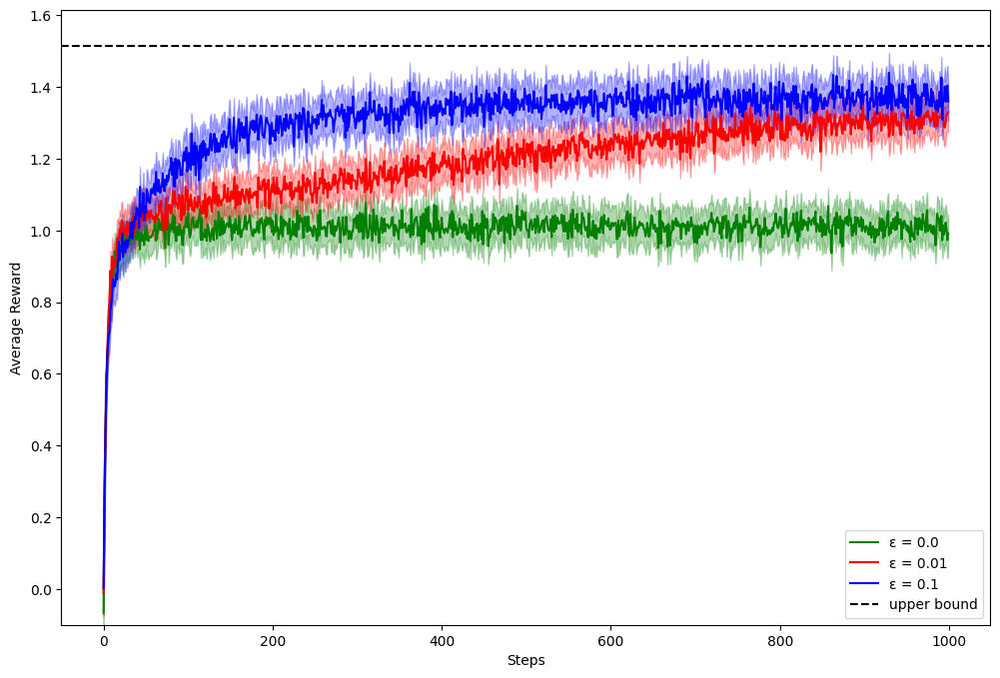

In [7]:
# Plot the "Average reward" figure
plot_curves(
    [results_rewards_0_0, results_rewards_0_01, results_rewards_0_1],
    ["ε = 0.0", "ε = 0.01", "ε = 0.1"],
    ["green", "red", "blue"],
    upper_bound_0_0,
    "Average Reward"
)

<Figure size 640x480 with 0 Axes>

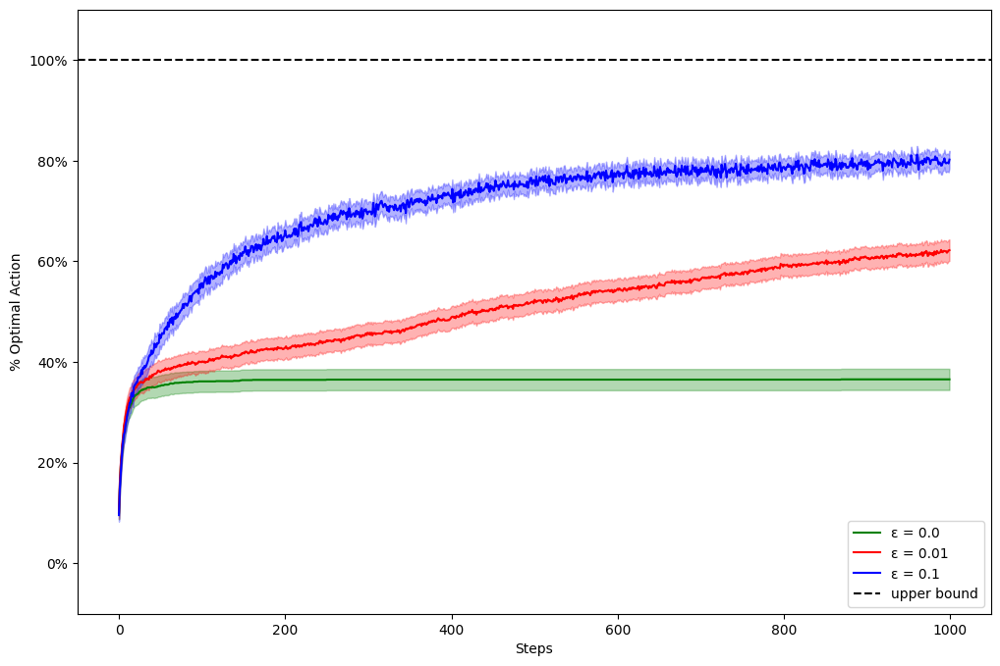

In [8]:
# Plot the "% Optimal action" figure
plot_curves(
    [results_action_0_0, results_action_0_01, results_action_0_1],
    ["ε = 0.0", "ε = 0.01", "ε = 0.1"],
    ["green", "red", "blue"],
    np.ones(time_step),  # For optimal action percentage, set upper_bound to 100%
    "% Optimal Action"
)

# Q6: Implement the ε-greedy algorithm with optimistic initial values, and the bandit algorithm with UCB action selection

In [9]:
""" Reproducing the Figure 2.3.
Please note, instead of using the sample-average technique,
Use equation 2.5 to update the Q values with \alpha=0.1
"""
class EpsilonGreedyAgent_1(object):
    def __init__(self, k: int, init: int, epsilon: float, update_method: str = "exponential") -> None:
        """Epsilon greedy bandit agent with options for exponential and sample average updates.

        Args:
            k (int): number of arms
            init (init): initial value of Q-values
            epsilon (float): random action probability
            update_method (str): method to update Q-values ("exponential" for Equation 2.5 or "sample" for Equation 2.1)
        """
        # Number of the arms. For example, k = 10 for 10-armed Bandit problem
        self.k = k

        # Initial Q value
        self.init = init

        # Epsilon value
        self.epsilon = epsilon

        # Update method ("exponential" or "sample")
        self.update_method = update_method

        # Q-values for each arm
        self.Q = None
        # Number of times each arm was pulled
        self.N = None
        # Current total number of steps
        self.t = None

    def reset(self) -> None:
        """Initialize or reset Q-values and counts

        This method should be called after __init__() at least once
        """
        self.Q = self.init * np.ones(self.k, dtype=np.float32)
        self.N = np.zeros(self.k, dtype=int)
        self.t = 0

    def choose_action(self) -> int:
        """Choose which arm to pull

        With probability 1 - epsilon, choose the best action (break ties arbitrarily, use argmax() from above).

        With probability epsilon, choose a random action.
        """
        if np.random.rand() < self.epsilon:
            # Random action
            return np.random.randint(self.k)
        else:
            # Greedy action
            return self.argmax(self.Q)

    def update(self, action: int, reward: float) -> None:
        """Update Q-values and N after observing reward.

        Args:
            action (int): index of pulled arm
            reward (float): reward obtained for pulling arm
        """
        # Increase the time step
        self.t += 1

        # Increment the count for the selected action
        self.N[action] += 1

        # Update Q-value based on the specified update method
        if self.update_method == "exponential":
            # Update Q-value using the exponential average with alpha = 0.1 (Equation 2.5)
            alpha = 0.1
            self.Q[action] = self.Q[action] + alpha * (reward - self.Q[action])
        elif self.update_method == "sample":
            # Update Q-value using the sample average (Equation 2.1)
            self.Q[action] += (reward - self.Q[action]) / self.N[action]

    @staticmethod
    def argmax(arr) -> int:
        """Argmax that breaks ties randomly

        Takes in a list of values and returns the index of the item with the highest value, breaking ties randomly.

        Note: np.argmax returns the first index that matches the maximum, so we define this method to use in EpsilonGreedy and UCB agents.
        Args:
            arr: sequence of values
        """
        # Find indices of the max value
        max_indices = np.flatnonzero(arr == np.max(arr))
        # Randomly choose one of the max indices
        return np.random.choice(max_indices)


In [10]:
""" Here is the implementation of the UCB agent.
"""
class UCBAgent(object):
    def __init__(self, k: int, init: int, c: float, update_method: str) -> None:
        """UCB bandit agent

        Args:
            k (int): number of arms
            init (init): initial value of Q-values
            c (float): UCB constant that controls degree of exploration
            update_method (str): method to update Q-values ("exponential" for Equation 2.5 or "sample" for Equation 2.1)
        """
        # Number of the arms. For example, k = 10 for 10-armed Bandit problem
        self.k = k

        # Initial Q value
        self.init = init

        # UCB exploration constant
        self.c = c

        # Update method ("exponential" or "sample")
        self.update_method = update_method

        # Q-values for each arm
        self.Q = None
        # Number of times each arm was pulled
        self.N = None
        # Current total number of steps
        self.t = None

    def reset(self) -> None:
        """Initialize or reset Q-values and counts

        This method should be called after __init__() at least once
        """
        self.Q = self.init * np.ones(self.k, dtype=np.float32)
        self.N = np.zeros(self.k, dtype=int)
        self.t = 0

    def choose_action(self) -> int:
        """Choose which arm to pull

        Use UCB action selection. Be sure to consider the case when N_t = 0 and break ties randomly (use argmax() from above).
        """
        # Consider the initial case when no action has been selected (N == 0), ensuring exploration.
        ucb_values = np.zeros(self.k, dtype=np.float32)
        for action in range(self.k):
            if self.N[action] == 0:
                # If an arm hasn't been pulled yet, ensure it gets selected (explore)
                ucb_values[action] = float('inf')
            else:
                # Compute the UCB value
                ucb_values[action] = self.Q[action] + self.c * np.sqrt(np.log(self.t + 1) / self.N[action])

        # Select the action with the highest UCB value, breaking ties randomly
        return self.argmax(ucb_values)

    def update(self, action: int, reward: float) -> None:
        """Update Q-values and N after observing reward.

        Args:
            action (int): index of pulled arm
            reward (float): reward obtained for pulling arm
        """
        # Increase the time step
        self.t += 1

        # Increment the count for the selected action
        self.N[action] += 1

        if self.update_method == "exponential":
            # Update Q-value using the exponential average with alpha = 0.1 (Equation 2.5)
            alpha = 0.1
            self.Q[action] = self.Q[action] + alpha * (reward - self.Q[action])
        elif self.update_method == "sample":
            # Update Q-value using the sample average (Equation 2.1)
            self.Q[action] += (reward - self.Q[action]) / self.N[action]

    @staticmethod
    def argmax(arr) -> int:
        """Argmax that breaks ties randomly

        Takes in a list of values and returns the index of the item with the highest value, breaking ties randomly.

        Note: np.argmax returns the first index that matches the maximum, so we define this method to use in EpsilonGreedy and UCB agents.
        Args:
            arr: sequence of values
        """
        # Find indices of the max value
        max_indices = np.flatnonzero(arr == np.max(arr))
        # Randomly choose one of the max indices
        return np.random.choice(max_indices)


In [11]:
# run epsilon-greedy agent with exponential average and constant step-size 
def run_epsilon_greedy_agent_1(run_num, time_step, epsilon, init, update_method="exponential"):
    """
    Run the EpsilonGreedyAgent_1 for multiple runs and steps.

    Args:
        run_num (int): number of runs
        time_step (int): number of time steps per run
        epsilon (float): epsilon value for the epsilon-greedy strategy
        init (float): initial value of Q-values
        update_method (str): method to update Q-values ("exponential" for Equation 2.5 or "sample" for Equation 2.1)

    Returns:
        results_rewards (np.array): Array of rewards of shape (run_num, time_step)
        results_action (np.array): Array of action optimality of shape (run_num, time_step)
        upper_bound (np.array): Array of best possible average rewards for each run
    """
    # Create the 10-armed Bandit problem
    k = 10
    env = Bandit(k)
    env.reset()

    # Create the agent with specified initial value, epsilon, and update method
    agent = EpsilonGreedyAgent_1(k=k, init=init, epsilon=epsilon, update_method=update_method)
    agent.reset()

    # Create numpy arrays to store results
    results_rewards = np.empty((run_num, time_step))
    results_action = np.empty((run_num, time_step))
    upper_bound = np.empty(run_num)

    # Loop over each run
    for r in tqdm.tqdm(range(run_num), desc="run number", position=0):
        # Reset environment and agent for each run
        env.reset()
        agent.reset()

        # Compute the upper bound for the current run
        upper_bound[r] = np.max(env.q_star)

        # Loop over each time step
        for t in tqdm.tqdm(range(time_step), desc="time step", position=1, leave=False):
            # Choose action using epsilon-greedy strategy
            act = agent.choose_action()

            # Interact with the environment to get the reward
            reward = env.step(act)

            # Update the agent with the observed reward
            agent.update(act, reward)

            # Save the reward
            results_rewards[r, t] = reward

            # compute the optimality
            if act in env.best_action():
                results_action[r, t] = 1
            else:
                results_action[r, t] = 0

    return results_rewards, results_action, upper_bound

In [13]:
"""Here is the implementation of running the UCB agent.
"""
# run UCB agent
def run_ucb_agent(run_num, time_step, c, update_method="sample"):
    # create the 10-armed Bandit problem
    k = 10
    env = Bandit(k)
    env.reset()

    # create the agent with the specified update method
    my_agent = UCBAgent(k=k, init=0.0, c=c, update_method=update_method)
    my_agent.reset()

    # create a numpy array to store rewards
    results_rewards = np.empty((run_num, time_step))

    # create a numpy array to store action optimality
    results_action = np.empty((run_num, time_step))

    # create an array to store the upper bound values for each run
    upper_bound = np.empty(run_num)

    # loop starts
    for r in tqdm.tqdm(range(run_num), desc="run number", position=0):

        # reset the environment and the agent
        env.reset()
        my_agent.reset()

        # update upper_bound[r] with the maximum true action value for this run
        upper_bound[r] = np.max(env.q_star)

        # loop over each time step
        for t in tqdm.tqdm(range(time_step), desc="time step", position=1, leave=False):
            
            # choose action for time step t
            act = my_agent.choose_action()

            # interact with the environment
            reward = env.step(act)

            # update the bandit agent with the observed reward
            my_agent.update(act, reward)

            # save the reward
            results_rewards[r, t] = reward

            # compute the optimality
            if act in env.best_action():
                results_action[r, t] = 1
            else:
                results_action[r, t] = 0

    return results_rewards, results_action, upper_bound


# Reproduce Figure 2.3 using exponential average (equation 2.5 with alpha = 0.1)

In [ ]:
"""Here is the implementation for running the experiment. You have to run the "run_ucb_agent" function
   for multiple times for different parameter combination. Please use smaller run_num and time_step for Debug only.
   For example, run_num = 100, time_step = 1000
"""
# Always set the random seed for results reproduction
np.random.seed(1234)
random.seed(1234)

# Set the running parameters
run_num = 2000
time_step = 1000

# 1. Run the epsilon-greedy agent experiment for initial value = 0.0, epsilon = 0.0, using exponential averaging
results_rewards_0_0, results_action_0_0, upper_bound_0_0 = run_epsilon_greedy_agent_1(
    run_num=run_num, time_step=time_step, epsilon=0.0, init=0.0, update_method="exponential"
)

# 2. Run the epsilon-greedy agent experiment for initial value = 5.0, epsilon = 0.0, using exponential averaging
results_rewards_5_0, results_action_5_0, upper_bound_5_0 = run_epsilon_greedy_agent_1(
    run_num=run_num, time_step=time_step, epsilon=0.0, init=5.0, update_method="exponential"
)

# 3. Run the epsilon-greedy agent experiment for initial value = 0.0, epsilon = 0.1, using exponential averaging
results_rewards_0_01, results_action_0_01, upper_bound_0_01 = run_epsilon_greedy_agent_1(
    run_num=run_num, time_step=time_step, epsilon=0.1, init=0.0, update_method="exponential"
)

# 4. Run the epsilon-greedy agent experiment for initial value = 5.0, epsilon = 0.1, using exponential averaging
results_rewards_5_01, results_action_5_01, upper_bound_5_01 = run_epsilon_greedy_agent_1(
    run_num=run_num, time_step=time_step, epsilon=0.1, init=5.0, update_method="exponential"
)

# 5. Run the UCB agent experiment for c = 2 using exponential averaging (Equation 2.5)
results_rewards_ucb, results_action_ucb, upper_bound_ucb = run_ucb_agent(
    run_num=run_num, time_step=time_step, c=2, update_method="exponential"
)

<Figure size 640x480 with 0 Axes>

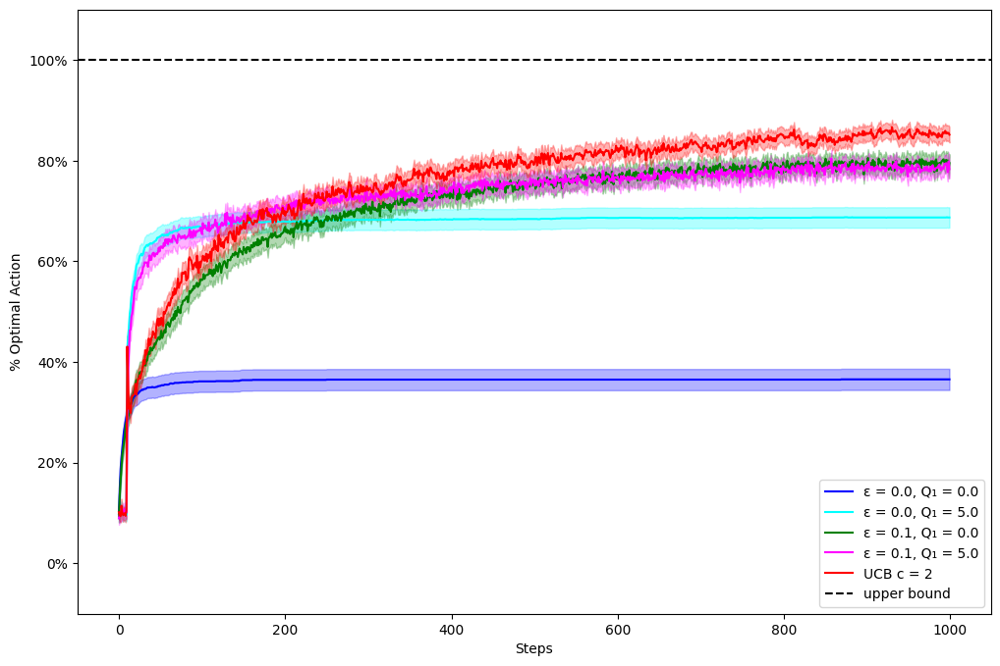

In [17]:
# Plot the "% Optimal action" figure
plot_curves(
    [
        results_action_0_0, 
        results_action_5_0, 
        results_action_0_01, 
        results_action_5_01, 
        results_action_ucb
    ],
    [
        "ε = 0.0, Q₁ = 0.0", 
        "ε = 0.0, Q₁ = 5.0", 
        "ε = 0.1, Q₁ = 0.0", 
        "ε = 0.1, Q₁ = 5.0", 
        "UCB c = 2"
    ],
    ["blue", "cyan", "green", "magenta", "red"],
    np.ones(time_step),  # Upper bound is 100% for % Optimal action plot
    "% Optimal Action"
)


# Reproduce Figure 2.4 using sample average (equation 2.1)

In [ ]:
"""Here is the implementation for running the experiment. You have to run the "run_ucb_agent" function
   for multiple times for different parameter combination. Please use smaller run_num and time_step for Debug only.
   For example, run_num = 100, time_step = 1000
"""
# Always set the random seed for results reproduction
np.random.seed(1234)
random.seed(1234)

# Set the number of runs
run_num = 2000
# Set the number of time steps
time_step = 1000

# 1. Run the epsilon-greedy agent experiment for initial value = 0.0, epsilon = 0.0 using sample averaging
results_rewards_0_0, results_action_0_0, upper_bound_0_0 = run_epsilon_greedy_agent_1(
    run_num=run_num, time_step=time_step, epsilon=0.0, init=0.0, update_method="sample"
)

# 2. Run the epsilon-greedy agent experiment for initial value = 5.0, epsilon = 0.0 using sample averaging
results_rewards_5_0, results_action_5_0, upper_bound_5_0 = run_epsilon_greedy_agent_1(
    run_num=run_num, time_step=time_step, epsilon=0.0, init=5.0, update_method="sample"
)

# 3. Run the epsilon-greedy agent experiment for initial value = 0.0, epsilon = 0.1 using sample averaging
results_rewards_0_01, results_action_0_01, upper_bound_0_01 = run_epsilon_greedy_agent_1(
    run_num=run_num, time_step=time_step, epsilon=0.1, init=0.0, update_method="sample"
)

# 4. Run the epsilon-greedy agent experiment for initial value = 5.0, epsilon = 0.1 using sample averaging
results_rewards_5_01, results_action_5_01, upper_bound_5_01 = run_epsilon_greedy_agent_1(
    run_num=run_num, time_step=time_step, epsilon=0.1, init=5.0, update_method="sample"
)

# 5. Run the UCB agent experiment for c = 2 using sample averaging (Equation 2.1)
results_rewards_ucb, results_action_ucb, upper_bound_ucb = run_ucb_agent(
    run_num=run_num, time_step=time_step, c=2, update_method="sample"
)

<Figure size 640x480 with 0 Axes>

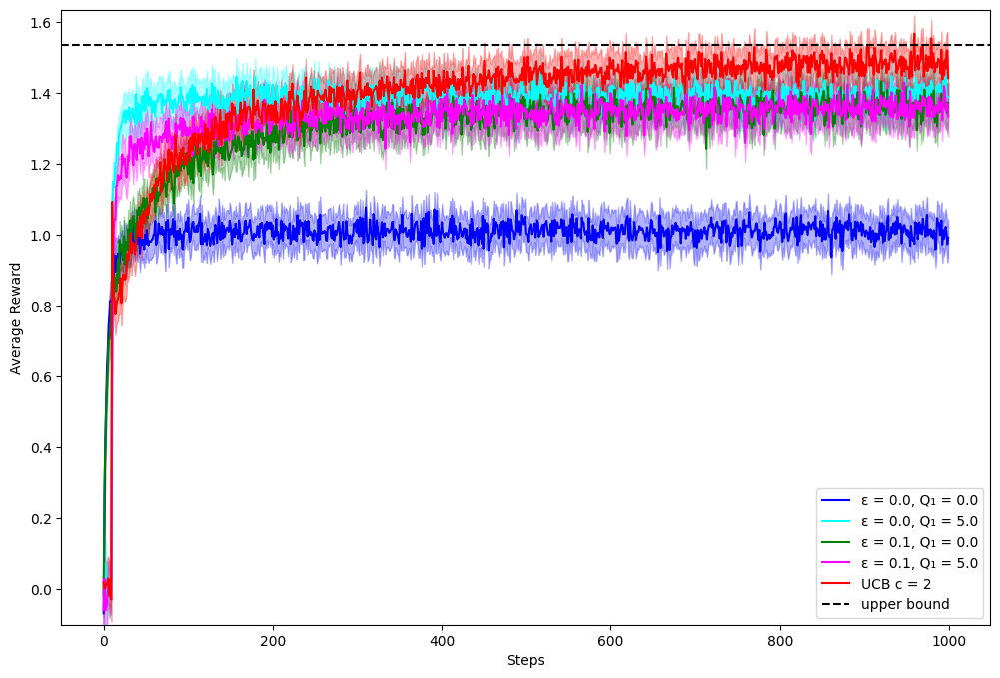

In [18]:
# Plot the "Average reward" figure
plot_curves(
    [
        results_rewards_0_0,
        results_rewards_5_0,
        results_rewards_0_01,
        results_rewards_5_01,
        results_rewards_ucb,
    ],
    [
        "ε = 0.0, Q₁ = 0.0",
        "ε = 0.0, Q₁ = 5.0",
        "ε = 0.1, Q₁ = 0.0",
        "ε = 0.1, Q₁ = 5.0",
        "UCB c = 2",
    ],
    ["blue", "cyan", "green", "magenta", "red"],
    upper_bound_ucb,
    "Average Reward",
)
